In [1]:
import sbibm
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
import pandas as pd

import torch

import warnings
warnings.simplefilter("ignore", UserWarning)

In [2]:
torch.manual_seed(1235)
random.seed(1235)
np.random.seed(1235)

In [3]:
sbibm.get_available_tasks()

['sir',
 'two_moons',
 'slcp',
 'gaussian_linear_uniform',
 'lotka_volterra',
 'bernoulli_glm',
 'gaussian_mixture',
 'gaussian_linear',
 'slcp_distractors',
 'bernoulli_glm_raw']

[Task two_moons]
thetas shape: torch.Size([100, 2]); xs shape: torch.Size([100, 2])
obs shape: torch.Size([1, 2]); ref sample shape: torch.Size([10000, 2])


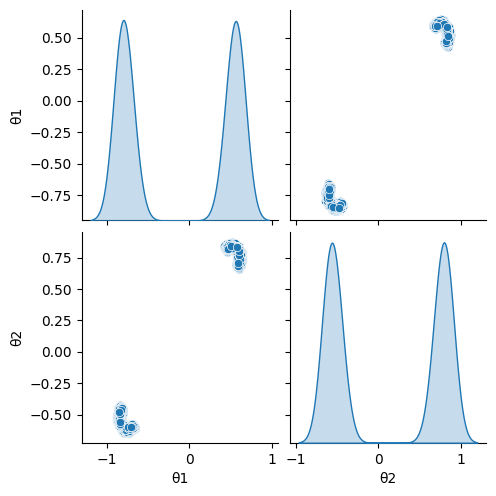

[Task slcp]
thetas shape: torch.Size([100, 5]); xs shape: torch.Size([100, 8])
obs shape: torch.Size([1, 8]); ref sample shape: torch.Size([10000, 5])


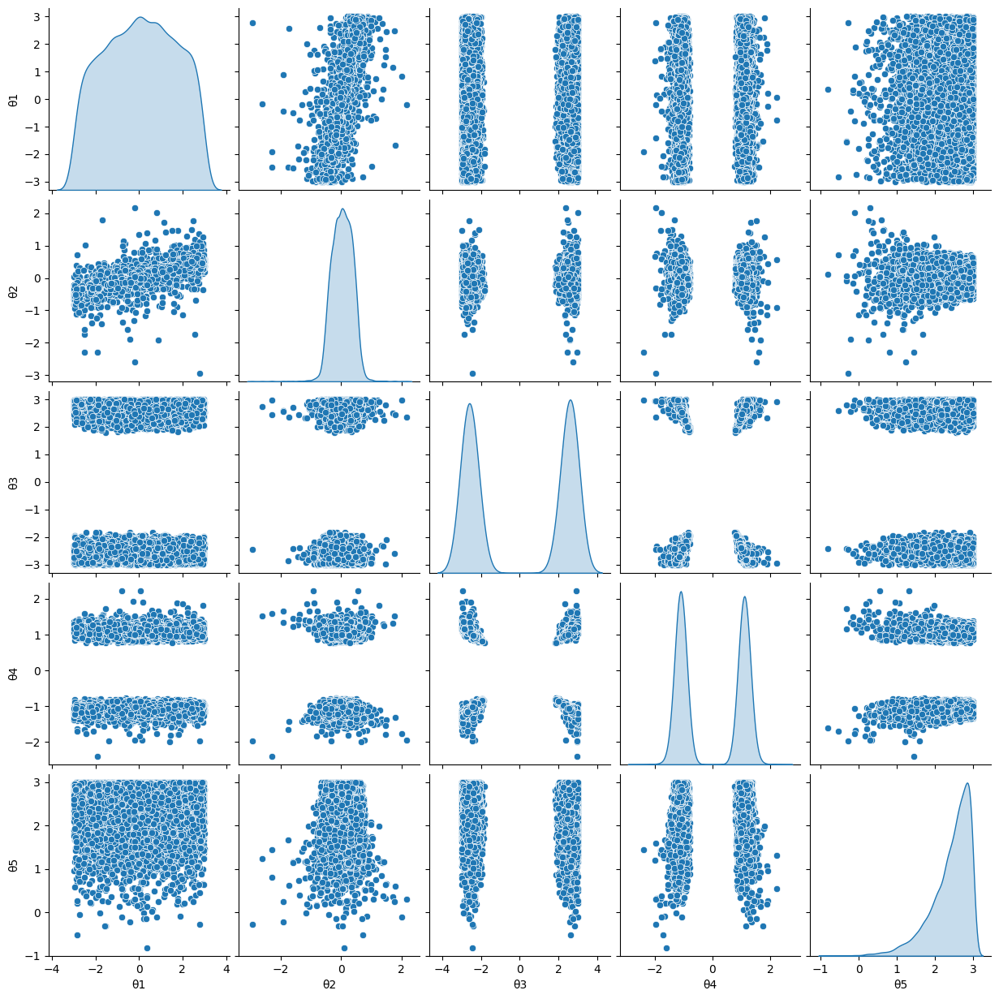

[Task gaussian_linear_uniform]
thetas shape: torch.Size([100, 10]); xs shape: torch.Size([100, 10])
obs shape: torch.Size([1, 10]); ref sample shape: torch.Size([10000, 10])


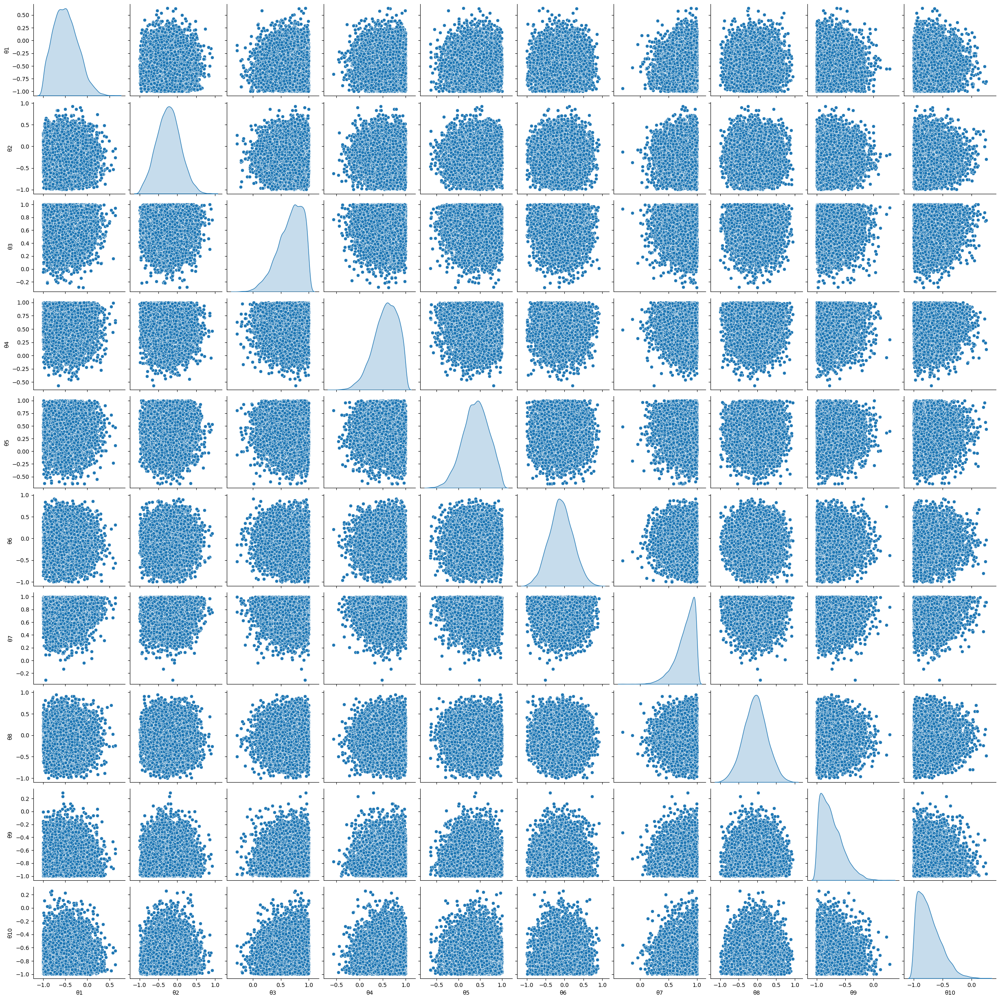

[Task bernoulli_glm]
thetas shape: torch.Size([100, 10]); xs shape: torch.Size([100, 10])
obs shape: torch.Size([1, 10]); ref sample shape: torch.Size([10000, 10])


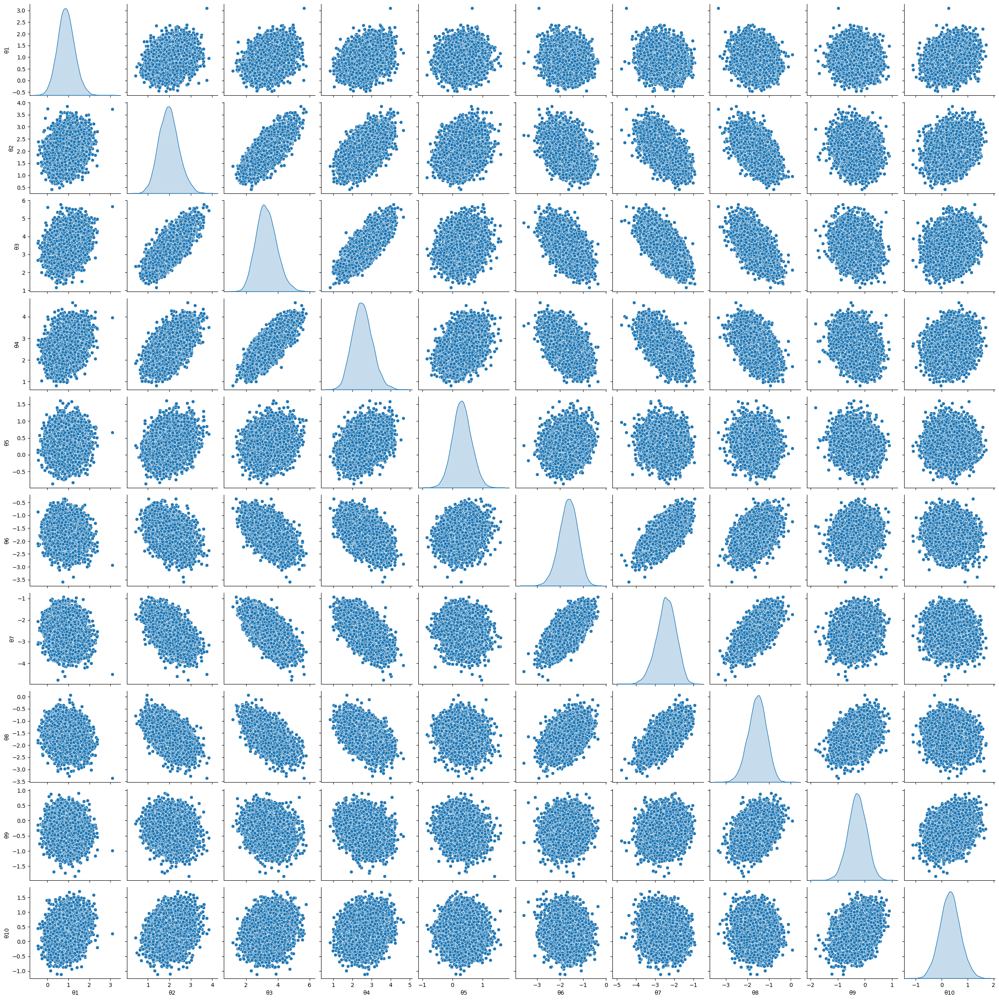

[Task gaussian_mixture]
thetas shape: torch.Size([100, 2]); xs shape: torch.Size([100, 2])
obs shape: torch.Size([1, 2]); ref sample shape: torch.Size([10000, 2])


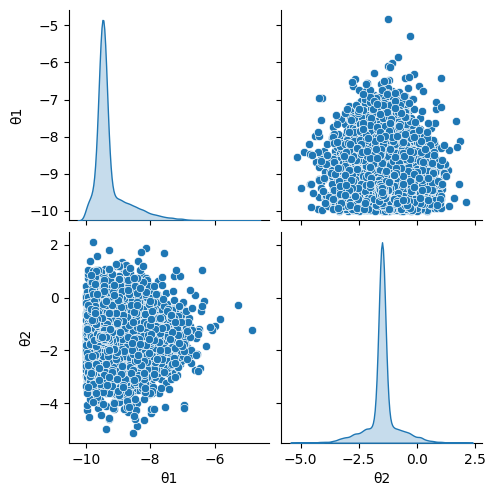

[Task gaussian_linear]
thetas shape: torch.Size([100, 10]); xs shape: torch.Size([100, 10])
obs shape: torch.Size([1, 10]); ref sample shape: torch.Size([10000, 10])


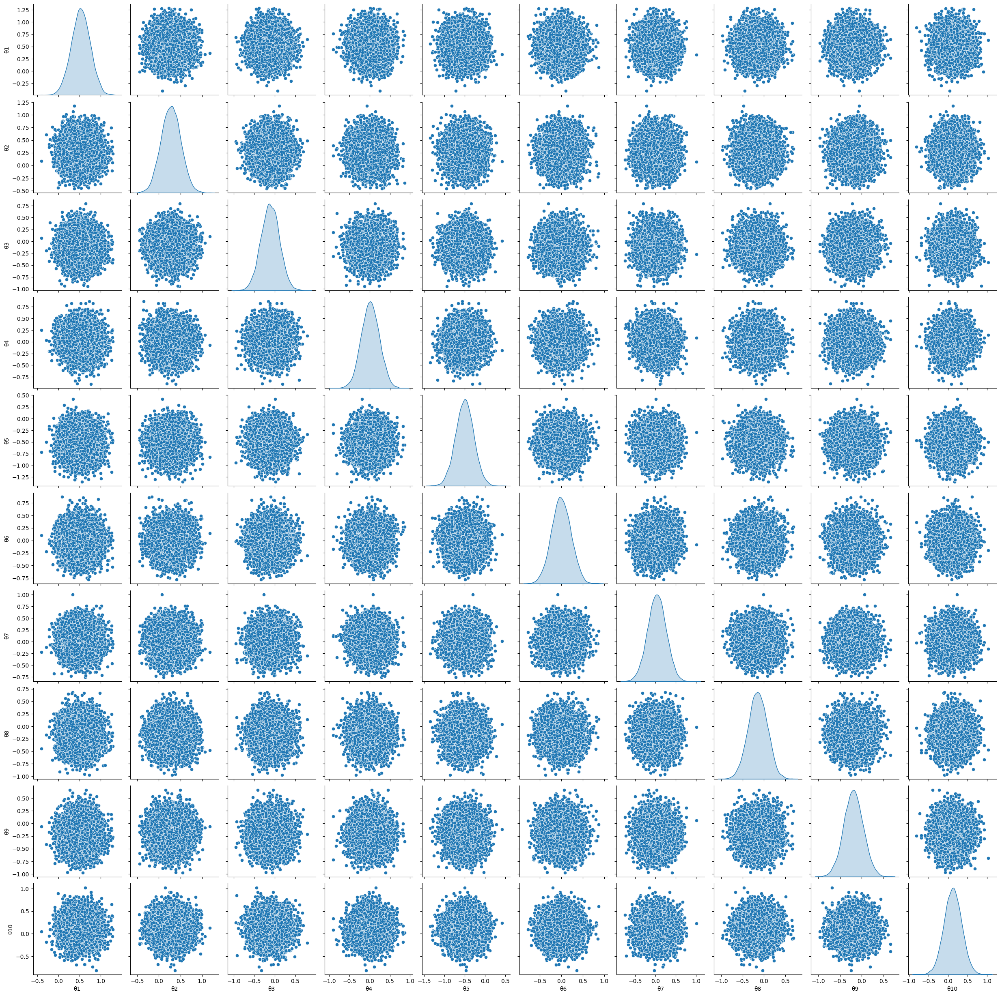

[Task slcp_distractors]
thetas shape: torch.Size([100, 5]); xs shape: torch.Size([100, 100])
obs shape: torch.Size([1, 100]); ref sample shape: torch.Size([10000, 5])


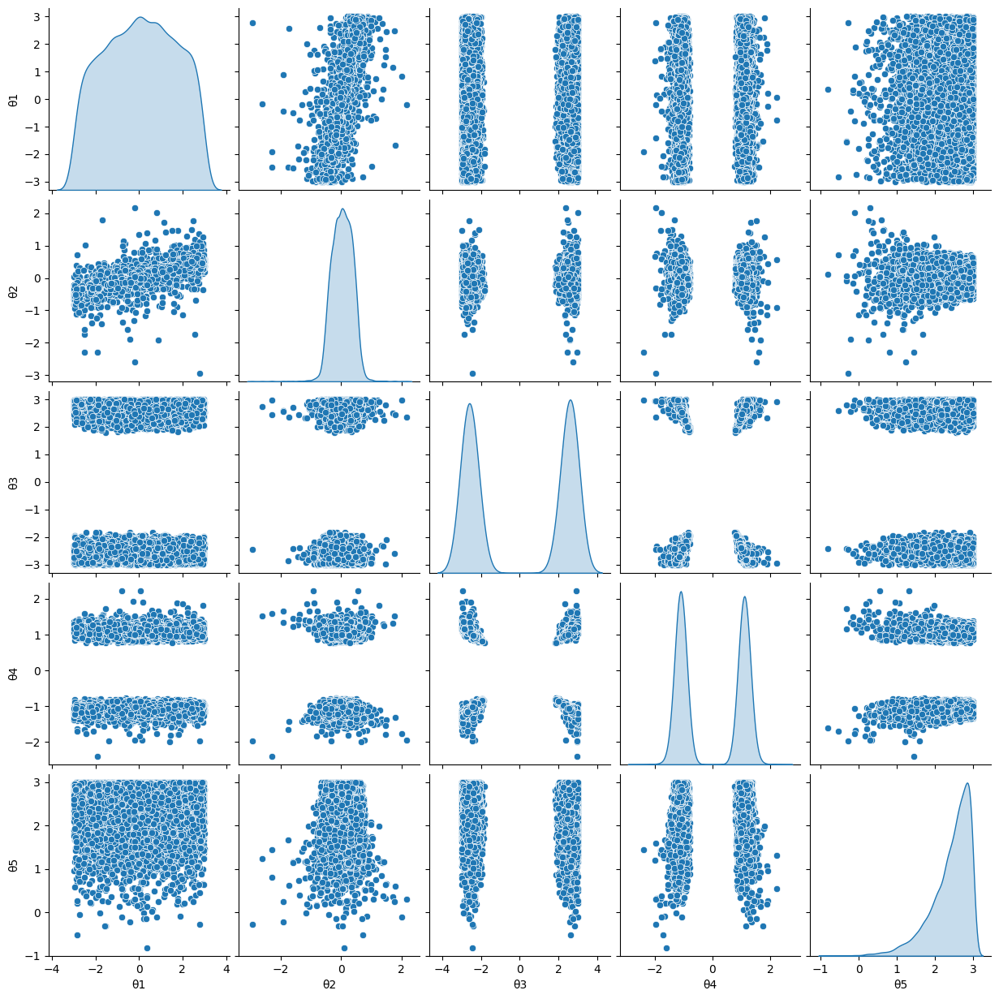

[Task bernoulli_glm_raw]
thetas shape: torch.Size([100, 10]); xs shape: torch.Size([100, 100])
obs shape: torch.Size([1, 100]); ref sample shape: torch.Size([10000, 10])


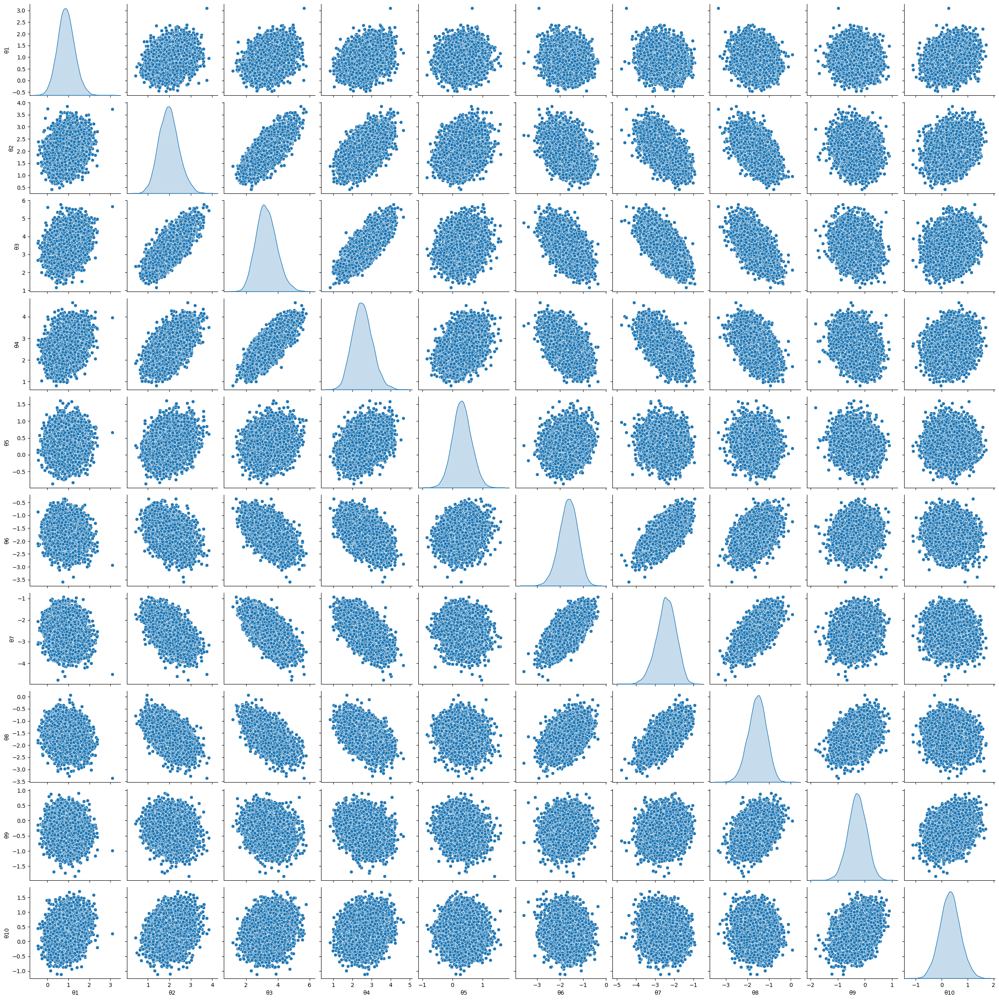

In [4]:
for t in sbibm.get_available_tasks():
    if t in ["sir", "lotka_volterra"]:
        continue

    print(f"[Task {t}]")
    task = sbibm.get_task(t)
    prior = task.get_prior()
    simulator = task.get_simulator()
    thetas = prior(num_samples=100)
    xs = simulator(thetas)
    print(f"thetas shape: {thetas.shape}; xs shape: {xs.shape}")

    observation = task.get_observation(num_observation=1)
    reference_samples = task.get_reference_posterior_samples(num_observation=1)
    print(f"obs shape: {observation.shape}; ref sample shape: {reference_samples.shape}")

    df = pd.DataFrame(reference_samples, 
                      columns=[f"θ{i+1}" for i in range(reference_samples.shape[-1])])
    sns.pairplot(df, diag_kind="kde")
    plt.show()
